# Data Challenge


### You belong to the data team at a local research hospital. You've been tasked with developing a means to help doctors diagnose breast cancer. You've been given data about biopsied breast cells; where it is benign (not harmful) or malignant (cancerous).

1. What features of a cell are the largest drivers of malignancy?
2. How would a physician use your product?
3. There is a non-zero cost in time and money to collect each feature about a given cell. How would you go about determining the most cost-effective method of detecting malignancy?




#### The dataset consists of 699 cells for which you have the following features: 

Sample code number: id number

Clump Thickness: 1 - 10

Uniformity of Cell Size: 1 - 10

Uniformity of Cell Shape: 1 - 10

Marginal Adhesion: 1 - 10

Single Epithelial Cell Size: 1 - 10

Bare Nuclei: 1 - 10

Bland Chromatin: 1 - 10

Normal Nucleoli: 1 - 10

Mitoses: 1 - 10

Class: (2 for benign, 4 for malignant)

In [5]:
import sys
!{sys.executable} -m pip install pandas-profiling

In [6]:
# Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import pandas_profiling as pp
from pandas_profiling import ProfileReport
#import etsy_py
from scipy.stats import shapiro
from scipy.stats import skew
from scipy.stats import kurtosis

In [7]:
def initial_analysis(df):
    """
    Given a dataframe produces a simple report on initial data analytics
    Params:
        - df 
    Returns:
        - Shape of dataframe records and columns
        - Columns and data types
    """
    print('Report of Initial Data Analysis:\n')
    print(f'Shape of dataframe: {df.shape}')
    print(f'Features and Data Types: \n {df.dtypes}')

def percent_missing(df):
    """
    Given a dataframe it calculates the percentage of missing records per column
    Params:
        - df
    Returns:
        - Dictionary of column name and percentage of missing records
    """
    col=list(df.columns)
    perc=[round(df[c].isna().mean()*100,2) for c in col]
    miss_dict=dict(zip(col,perc))
    return miss_dict


def normality_test(df,col_list):
    """
    Given a dataframe determines whether each numerical column is Gaussian 
    Ho = Assumes distribution is not Gaussian
    Ha = Assumes distribution is Gaussian
    Params:
        - df
    Returns:
        - W Statistic
        - p-value
        - List of columns that do not have gaussian distribution
    """
    non_gauss=[]
    w_stat=[]
    # Determine if each sample of numerical feature is gaussian
    alpha = 0.05
    for n in numeric_list:
        stat,p=shapiro(df[n])
        print(sns.distplot(df[n]))
        print(tuple(skew(df[n]),kurtosis(df[n])))

        if p <= alpha: # Reject Ho -- Distribution is not normal
            non_gauss.append(n)
            w_stat.append(stat)
    # Dictionary of numerical features not gaussian and W-Statistic        
    norm_dict=dict(zip(non_gauss,w_stat))
    return norm_dict

# Exploratory Data Analysis


In [9]:
bcw_pd = pd.read_csv('C:/Users/MMS-012/Documents/breast-cancer-wisconsin.csv', header=None)
bcw_pd.columns=['ID','ClumpThick','UniformityOfCellSize','UniformityOfCellShape','MarginalAdhesion',
                'SingleEpithelialCellSize','BareNuclei','BlandChromatin','NormalNucleoli','Mitoses','Class']


In [10]:

bcw_pd

,ID,ClumpThick,UniformityOfCellSize,UniformityOfCellShape,MarginalAdhesion,SingleEpithelialCellSize,BareNuclei,BlandChromatin,NormalNucleoli,Mitoses,Class
0,1000025,5,1,1,1,2,1,3,1,1,2
1,1002945,5,4,4,5,7,10,3,2,1,2
2,1015425,3,1,1,1,2,2,3,1,1,2
3,1016277,6,8,8,1,3,4,3,7,1,2
4,1017023,4,1,1,3,2,1,3,1,1,2
...,...,...,...,...,...,...,...,...,...,...,...
694,776715,3,1,1,1,3,2,1,1,1,2
695,841769,2,1,1,1,2,1,1,1,1,2
696,888820,5,10,10,3,7,3,8,10,2,4
697,897471,4,8,6,4,3,4,10,6,1,4


In [11]:
initial_analysis(bcw_pd)

Report of Initial Data Analysis:

Shape of dataframe: (699, 11)
Features and Data Types: 
 ID                           int64
ClumpThick                   int64
UniformityOfCellSize         int64
UniformityOfCellShape        int64
MarginalAdhesion             int64
SingleEpithelialCellSize     int64
BareNuclei                  object
BlandChromatin               int64
NormalNucleoli               int64
Mitoses                      int64
Class                        int64
dtype: object


#### Weird that 'BareNuclei' is type 'object' and not 'int64'

In [12]:
# bcw_pd['BareNuclei'] = pd.to_numeric(bcw_pd['BareNuclei'])
bcw_pd['BareNuclei'][23]

'?'

In [13]:
bcw_pd[ bcw_pd['BareNuclei'] == '?'].index

Int64Index([23, 40, 139, 145, 158, 164, 235, 249, 275, 292, 294, 297, 315, 321,
            411, 617],
           dtype='int64')

In [14]:
bcw_pd.drop(bcw_pd[ bcw_pd['BareNuclei'] == '?'].index, inplace=True)

In [15]:
# bcw_pd = bcw_pd.drop(bcw_pd.index[[23]])

In [16]:
bcw_pd.describe()

,ID,ClumpThick,UniformityOfCellSize,UniformityOfCellShape,MarginalAdhesion,SingleEpithelialCellSize,BlandChromatin,NormalNucleoli,Mitoses,Class
count,6.830000e+02,683.000000,683.000000,683.000000,683.000000,683.000000,683.000000,683.000000,683.000000,683.000000
mean,1.076720e+06,4.442167,3.150805,3.215227,2.830161,3.234261,3.445095,2.869693,1.603221,2.699854
std,6.206440e+05,2.820761,3.065145,2.988581,2.864562,2.223085,2.449697,3.052666,1.732674,0.954592
min,6.337500e+04,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,2.000000
25%,8.776170e+05,2.000000,1.000000,1.000000,1.000000,2.000000,2.000000,1.000000,1.000000,2.000000
50%,1.171795e+06,4.000000,1.000000,1.000000,1.000000,2.000000,3.000000,1.000000,1.000000,2.000000
75%,1.238705e+06,6.000000,5.000000,5.000000,4.000000,4.000000,5.000000,4.000000,1.000000,4.000000
max,1.345435e+07,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,4.000000


In [17]:
bcw_pd['BareNuclei'] = pd.to_numeric(bcw_pd['BareNuclei'])

In [18]:
initial_analysis(bcw_pd)

Report of Initial Data Analysis:

Shape of dataframe: (683, 11)
Features and Data Types: 
 ID                          int64
ClumpThick                  int64
UniformityOfCellSize        int64
UniformityOfCellShape       int64
MarginalAdhesion            int64
SingleEpithelialCellSize    int64
BareNuclei                  int64
BlandChromatin              int64
NormalNucleoli              int64
Mitoses                     int64
Class                       int64
dtype: object


#### So everything is numbers now! 

### Pandas Profiling

In [19]:
bcw_profile = ProfileReport(bcw_pd)
bcw_profile.to_file(output_file='output.html')

### the report above finds no missing values in the dataset 
### columns 2 and 3 are highly correlated - Uniformity of Cell Size: 1 - 10 and Uniformity of Cell Shape: 1 - 10

In [20]:
bcw_profile

Class
2    [[AxesSubplot(0.125,0.725918;0.215278x0.154082...
4    [[AxesSubplot(0.125,0.725918;0.215278x0.154082...
dtype: object

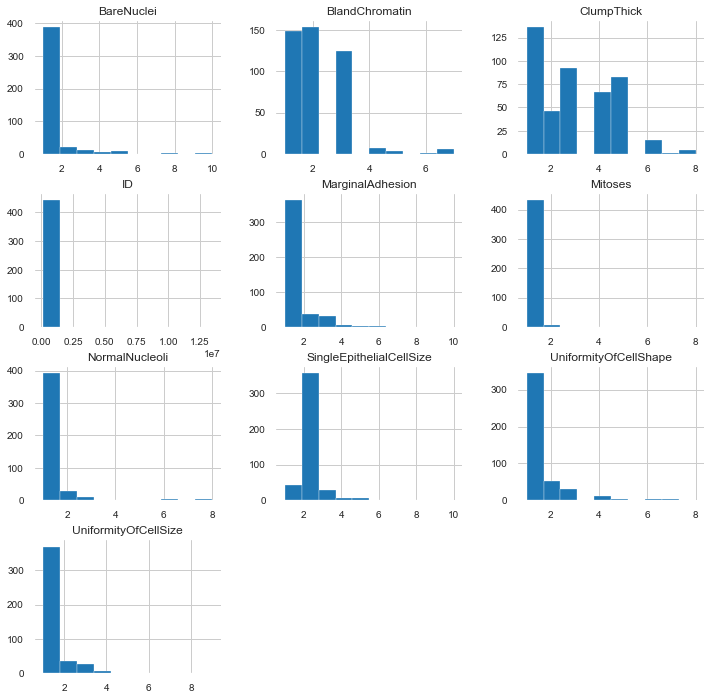

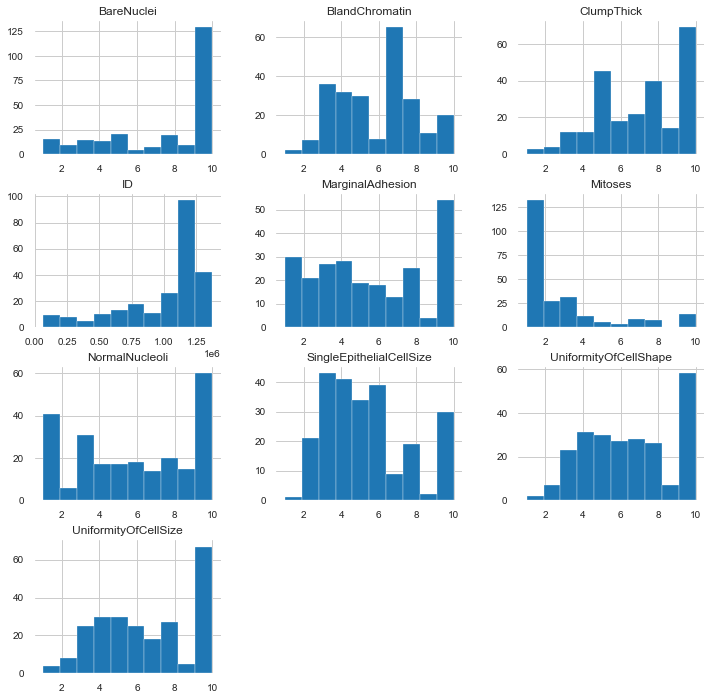

In [21]:
#Visualization of data
bcw_pd.groupby('Class').hist(figsize=(12, 12))

## Machine Learning 

In [22]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import plot_confusion_matrix
from sklearn import metrics
from matplotlib import pyplot

In [23]:
#save the features as your x values on which you want to train
#save the output, i.e. the predictor benign or malignant as your y value
X = bcw_pd.iloc[:, 1:10].values
Y = bcw_pd.iloc[:, 10].values
X


array([[ 5,  1,  1, ...,  3,  1,  1],
       [ 5,  4,  4, ...,  3,  2,  1],
       [ 3,  1,  1, ...,  3,  1,  1],
       ...,
       [ 5, 10, 10, ...,  8, 10,  2],
       [ 4,  8,  6, ..., 10,  6,  1],
       [ 4,  8,  8, ..., 10,  4,  1]], dtype=int64)

In [24]:
# Splitting the dataset into the Training set and Test set

X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.25, random_state = 0)

In [25]:
print(X_train.shape)
print(Y_train.shape)
print(X_test.shape)
print(Y_test.shape)


(512, 9)
(512,)
(171, 9)
(171,)


In [26]:
X_train[0]


array([ 7,  6, 10,  5,  3, 10,  9, 10,  2], dtype=int64)

#### a. Since the dataset contains numeric values, we do not need to think about Encoding any part of it. 
#### b. The dataset is also at the same scales, so we do not neeed to worry about Feature Scaling - everything lies between 1-10 

------

### Since the outcome variable is only two classes - benign (2) or malignant (4), we use Classification Algorithms
### The data is labelled, so it is supervised machine learning. 

#### We have different types of classification algorithms in Machine Learning :-

1. Logistic Regression

2. Nearest Neighbor

3. Support Vector Machines

4. Kernel SVM

5. Naïve Bayes

6. Decision Tree Algorithm

7. Random Forest Classification 


#### In the interest of time, I am going to stay with the simplest of the methods, the Logistic Regression and try to answer the questions with it. 

## Logistic Regression 

### Logistic regression is a statistical method for predicting binary classes. The outcome or target variable is binary in nature. It computes the probability of an event occurrence (Estimation is done through maximum likelihood.)

### It uses a log of odds as the dependent variable. Logistic Regression predicts the probability of occurrence of a binary event utilizing a logit function.

Linear Regression Equation:

                    y = B0 + B1X1 + B2X2 + .. + BnXn

Sigmoid Function:
                
                    p = 1/ (1+e^(-y))



In [27]:
classifier = LogisticRegression(random_state = 0)
classifier.fit(X_train, Y_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=0, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [28]:
#predicting the Test set results
Y_pred = classifier.predict(X_test)
Y_pred

array([2, 2, 4, 4, 2, 2, 2, 4, 2, 2, 4, 2, 4, 2, 2, 2, 4, 4, 4, 2, 2, 2,
       4, 2, 4, 4, 2, 2, 2, 4, 2, 4, 4, 2, 2, 2, 4, 4, 2, 4, 2, 2, 2, 2,
       2, 2, 2, 4, 2, 2, 4, 2, 4, 2, 2, 2, 4, 4, 2, 4, 2, 2, 2, 2, 2, 2,
       2, 2, 4, 4, 2, 2, 2, 2, 2, 2, 4, 2, 2, 2, 4, 2, 4, 2, 2, 4, 2, 4,
       4, 2, 4, 2, 4, 4, 2, 4, 4, 4, 4, 2, 2, 2, 4, 4, 2, 2, 4, 2, 2, 2,
       4, 2, 2, 4, 2, 2, 2, 2, 2, 2, 2, 4, 2, 2, 4, 4, 2, 4, 2, 4, 2, 2,
       4, 2, 2, 4, 2, 4, 2, 2, 2, 4, 2, 2, 2, 4, 4, 2, 4, 2, 4, 2, 2, 2,
       2, 2, 4, 4, 2, 4, 4, 4, 4, 2, 4, 2, 2, 2, 2, 2, 2], dtype=int64)

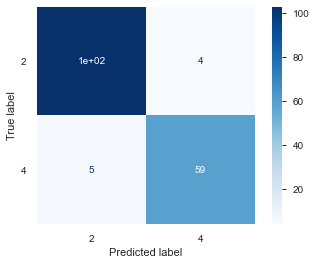

In [29]:
disp = plot_confusion_matrix(classifier, X_test, Y_test,
                                 cmap=plt.cm.Blues)

In [30]:
print("Classification report for classifier %s:\n%s\n"
      % (classifier, metrics.classification_report(Y_test, Y_pred)))

Classification report for classifier LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=0, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False):
              precision    recall  f1-score   support

           2       0.95      0.96      0.96       107
           4       0.94      0.92      0.93        64

    accuracy                           0.95       171
   macro avg       0.95      0.94      0.94       171
weighted avg       0.95      0.95      0.95       171




#### Accuracy: Overall, how often is the classifier correct? 

Accuracy     = (TP + TN)/Total

#### Precision: When it predicts yes, how often is it correct?

Precision = TP/predicted yes

#### Recall:  When it’s actually yes, how often does it predict yes?

Recall = TP/actual yes 


## Question 1: What features of a cell are the largest drivers of malignancy?

### My first thought was to rank them based on their coefficient

### One of the simplest options to get a feeling for the "influence" of a given feature will be to consider the magnitude of its coefficient times the standard deviation of the corresponding parameter in the data.


In [31]:
classifier.coef_

array([[0.41717317, 0.10269451, 0.2743462 , 0.21226517, 0.25587223,
        0.43988755, 0.32828187, 0.23649407, 0.18697049]])

###  But,  many features look equally useful. What about the "spread" of the features themselves? I multiply by the standard deviation. 

In [32]:
np.std(X_train,0)*classifier.coef_

array([[1.16938626, 0.31319696, 0.8099624 , 0.60256078, 0.57697071,
        1.58998997, 0.81725285, 0.73597852, 0.32033141]])

#### plot a bar graph 

Feature: 0, Score: 0.41717
Feature: 1, Score: 0.10269
Feature: 2, Score: 0.27435
Feature: 3, Score: 0.21227
Feature: 4, Score: 0.25587
Feature: 5, Score: 0.43989
Feature: 6, Score: 0.32828
Feature: 7, Score: 0.23649
Feature: 8, Score: 0.18697


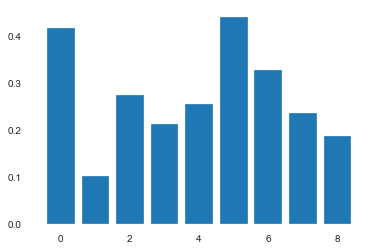

In [33]:
# get importance
importance = classifier.coef_[0]
# summarize feature importance
for i,v in enumerate(importance):
	print('Feature: %0d, Score: %.5f' % (i,v))
# plot feature importance
pyplot.bar([x for x in range(len(importance))], importance)
pyplot.show()

###  Although, the coefficient size does not always reflect feature importance, and is only very crude method of estimation. 

## Next Steps: 

1. The correlation between the two features needs to explored in detail. If they are indeed correlated, both do not need to be used in the training, only one suffices. 

2. Other models like Decision Tree algorithms like the CART or Random Forests, offer more robust methods of finding feature importance and can be compared with the simplistic Logistic Regression method. 

## Question 2: How would a physician use your product?

#### The model is trained, and now whenever the physician has new data, they can use the model directly to predict the labels. 

For example, if they do a new exam on a person, they can fill in all the columns for the sample, and then ask the model to predict if the new person has a benign or malignant tumor. And they can be sure that the prediction is 95% accurate




## Question 3: There is a non-zero cost in time and money to collect each feature about a given cell. How would you go about determining the most cost-effective method of detecting malignancy?

#### The most cost effective way of detecting malignancy is to identify the features that are most important in detecting malignancy. 

Therefore, given a fixed time and money budget alloted, one can select the topmost features as ranked by the model above. And then only those features can be used to detect malignancy. 